<a href="https://colab.research.google.com/github/lucassss-29/RcnnBoltDetection/blob/master/rcnn_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import matplotlib.pyplot as plt
import time
import torchvision
import albumentations as A
import cv2
import numpy as np
import glob as glob
import os

from albumentations.pytorch import ToTensorV2
from tqdm.auto import tqdm
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from xml.etree import ElementTree as et
from torch.utils.data import Dataset, DataLoader

# Git hub

In [2]:
!git clone https://github.com/lucassss-29/RcnnBoltDetection.git

Cloning into 'RcnnBoltDetection'...
remote: Enumerating objects: 1031, done.
remote: Total 1031 (delta 0), reused 0 (delta 0), pack-reused 1031
Receiving objects: 100% (1031/1031), 480.57 MiB | 19.52 MiB/s, done.
Resolving deltas: 100% (475/475), done.
Updating files: 100% (1003/1003), done.


In [3]:
print(torch.cuda.is_available())

True


# **Config**

In [2]:
BATCH_SIZE = 8 # increase / decrease according to GPU memeory
RESIZE_TO = 512 # resize the image for training and transforms
NUM_EPOCHS = 50 # number of epochs to train for

DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# training images and XML files directory
TRAIN_DIR = '/content/RcnnBoltDetection/Bolt Detection/train'
# validation images and XML files directory
VALID_DIR = '/content/RcnnBoltDetection/Bolt Detection/test'

# classes: 0 index is reserved for background
CLASSES = [
    'background', 'bolt_a', 'bolt_b', 'bolt_c', 'vague'
]
NUM_CLASSES = 5

# whether to visualize images after crearing the data loaders
VISUALIZE_TRANSFORMED_IMAGES = False

# location to save model and plots
OUT_DIR = '/content/RcnnBoltDetection/outputs'
SAVE_PLOTS_EPOCH = 10 # save loss plots after these many epochs
SAVE_MODEL_EPOCH = 10 # save model after these many epochs

# **Utils**

In [3]:
# this class keeps track of the training and validation loss values...
# ... and helps to get the average for each epoch as well
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

def collate_fn(batch):
    """
    To handle the data loading as different images may have different number
    of objects and to handle varying size tensors as well.
    """
    return tuple(zip(*batch))

# define the training tranforms
def get_train_transform():
    return A.Compose([
        A.Flip(0.5),
        A.RandomRotate90(0.5),
        A.MotionBlur(p=0.2),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.Blur(blur_limit=3, p=0.1),
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })

# define the validation transforms
def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


def show_tranformed_image(train_loader):
    """
    This function shows the transformed images from the `train_loader`.
    Helps to check whether the tranformed images along with the corresponding
    labels are correct or not.
    Only runs if `VISUALIZE_TRANSFORMED_IMAGES = True` in config.py.
    """
    if len(train_loader) > 0:
        for i in range(1):
            images, targets = next(iter(train_loader))
            images = list(image.to(DEVICE) for image in images)
            targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
            boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
            sample = images[i].permute(1, 2, 0).cpu().numpy()
            for box in boxes:
                cv2.rectangle(sample,
                            (box[0], box[1]),
                            (box[2], box[3]),
                            (0, 0, 255), 2)
            cv2.imshow('Transformed image', sample)
            cv2.waitKey(0)
            cv2.destroyAllWindows()

# **Datasets**

# DS Preparing

In [4]:
# the dataset class
class MicrocontrollerDataset(Dataset):
    def __init__(self, dir_path, width, height, classes, transforms=None):
        self.transforms = transforms
        self.dir_path = dir_path
        self.height = height
        self.width = width
        self.classes = classes

        # get all the image paths in sorted order
        self.image_paths = glob.glob(f"{self.dir_path}/*.jpg")
        self.all_images = [image_path.split('/')[-1] for image_path in self.image_paths]
        self.all_images = sorted(self.all_images)

    def __getitem__(self, idx):
        # capture the image name and the full image path
        image_name = self.all_images[idx]
        image_path = os.path.join(self.dir_path, image_name)

        # read the image
        image = cv2.imread(image_path)
        # convert BGR to RGB color format
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        # capture the corresponding XML file for getting the annotations
        annot_filename = image_name[:-4] + '.xml'
        annot_file_path = os.path.join(self.dir_path, annot_filename)

        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()

        # get the height and width of the image
        image_width = image.shape[1]
        image_height = image.shape[0]

        # box coordinates for xml files are extracted and corrected for image size given
        for member in root.findall('object'):
            # map the current object name to `classes` list to get...
            # ... the label index and append to `labels` list
            labels.append(self.classes.index(member.find('name').text))

            # xmin = left corner x-coordinates
            xmin = int(member.find('bndbox').find('xmin').text)
            # xmax = right corner x-coordinates
            xmax = int(member.find('bndbox').find('xmax').text)
            # ymin = left corner y-coordinates
            ymin = int(member.find('bndbox').find('ymin').text)
            # ymax = right corner y-coordinates
            ymax = int(member.find('bndbox').find('ymax').text)

            # resize the bounding boxes according to the...
            # ... desired `width`, `height`
            xmin_final = (xmin/image_width)*self.width
            xmax_final = (xmax/image_width)*self.width
            ymin_final = (ymin/image_height)*self.height
            yamx_final = (ymax/image_height)*self.height

            boxes.append([xmin_final, ymin_final, xmax_final, yamx_final])

        # bounding box to tensor
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # area of the bounding boxes
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # no crowd instances
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        # labels to tensor
        labels = torch.as_tensor(labels, dtype=torch.int64)

        # prepare the final `target` dictionary
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        # apply the image transforms
        if self.transforms:
            sample = self.transforms(image = image_resized,
                                     bboxes = target['boxes'],
                                     labels = labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])

        return image_resized, target

    def __len__(self):
        return len(self.all_images)

# prepare the final datasets and data loaders
train_dataset = MicrocontrollerDataset(TRAIN_DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_train_transform())
valid_dataset = MicrocontrollerDataset(VALID_DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform())
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,
    collate_fn=collate_fn
)
valid_loader = DataLoader(
    valid_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    collate_fn=collate_fn
)
print(f"Number of training samples: {len(train_dataset)}")
print(f"Number of validation samples: {len(valid_dataset)}\n")

Number of training samples: 236
Number of validation samples: 101



# **Engine**


In [5]:
plt.style.use('ggplot')

# function for running training iterations
def train(train_data_loader, model):
    print('Training')
    global train_itr
    global train_loss_list

     # initialize tqdm progress bar
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        optimizer.zero_grad()
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()
        train_loss_list.append(loss_value)

        train_loss_hist.send(loss_value)

        losses.backward()
        optimizer.step()

        train_itr += 1

        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return train_loss_list

# function for running validation iterations
def validate(valid_data_loader, model):
    print('Validating')
    global val_itr
    global val_loss_list

    # initialize tqdm progress bar
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()
        val_loss_list.append(loss_value)

        val_loss_hist.send(loss_value)

        val_itr += 1

        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return val_loss_list

In [6]:
def create_model(num_classes):

    # load Faster RCNN pre-trained model
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

    # get the number of input features
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # define a new head for the detector with required number of classes
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

In [24]:
!pip install numba

In [26]:
from numba import cuda
cuda.select_device(0)
cuda.close()

In [7]:
if __name__ == '__main__':
    # initialize the model and move to the computation device
    model = create_model(num_classes=NUM_CLASSES)
    model = model.to(DEVICE)
    # get the model parameters
    params = [p for p in model.parameters() if p.requires_grad]
    # define the optimizer
    optimizer = torch.optim.SGD(params, lr=0.001, momentum=0.9, weight_decay=0.0005)

    # initialize the Averager class
    train_loss_hist = Averager()
    val_loss_hist = Averager()
    train_itr = 1
    val_itr = 1
    # train and validation loss lists to store loss values of all...
    # ... iterations till ena and plot graphs for all iterations
    train_loss_list = []
    val_loss_list = []

    # name to save the trained model with
    MODEL_NAME = 'model'

    # whether to show transformed images from data loader or not
    if VISUALIZE_TRANSFORMED_IMAGES:
        from utils import show_tranformed_image
        show_tranformed_image(train_loader)

    # start the training epochs
    for epoch in range(NUM_EPOCHS):
        print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")

        # reset the training and validation loss histories for the current epoch
        train_loss_hist.reset()
        val_loss_hist.reset()

        # create two subplots, one for each, training and validation
        figure_1, train_ax = plt.subplots()
        figure_2, valid_ax = plt.subplots()

        # start timer and carry out training and validation
        start = time.time()
        train_loss = train(train_loader, model)
        val_loss = validate(valid_loader, model)
        print(f"Epoch #{epoch} train loss: {train_loss_hist.value:.3f}")
        print(f"Epoch #{epoch} validation loss: {val_loss_hist.value:.3f}")
        end = time.time()
        print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch}")

        if (epoch+1) % SAVE_MODEL_EPOCH == 0: # save model after every n epochs
            torch.save(model.state_dict(), f"{OUT_DIR}/model{epoch+1}.pth")
            print('SAVING MODEL COMPLETE...\n')

        if (epoch+1) % SAVE_PLOTS_EPOCH == 0: # save loss plots after n epochs
            train_ax.plot(train_loss, color='blue')
            train_ax.set_xlabel('iterations')
            train_ax.set_ylabel('train loss')
            valid_ax.plot(val_loss, color='red')
            valid_ax.set_xlabel('iterations')
            valid_ax.set_ylabel('validation loss')
            figure_1.savefig(f"{OUT_DIR}/train_loss_{epoch+1}.png")
            figure_2.savefig(f"{OUT_DIR}/valid_loss_{epoch+1}.png")
            print('SAVING PLOTS COMPLETE...')

        if (epoch+1) == NUM_EPOCHS: # save loss plots and model once at the end
            train_ax.plot(train_loss, color='blue')
            train_ax.set_xlabel('iterations')
            train_ax.set_ylabel('train loss')
            valid_ax.plot(val_loss, color='red')
            valid_ax.set_xlabel('iterations')
            valid_ax.set_ylabel('validation loss')
            figure_1.savefig(f"{OUT_DIR}/train_loss_{epoch+1}.png")
            figure_2.savefig(f"{OUT_DIR}/valid_loss_{epoch+1}.png")

            torch.save(model.state_dict(), f"{OUT_DIR}/model{epoch+1}.pth")

        plt.close('all')
        # sleep for 5 seconds after each epoch
        time.sleep(5)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)



EPOCH 1 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #0 train loss: 0.655
Epoch #0 validation loss: 0.581
Took 1.292 minutes for epoch 0

EPOCH 2 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #1 train loss: 0.415
Epoch #1 validation loss: 0.485
Took 1.174 minutes for epoch 1

EPOCH 3 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #2 train loss: 0.353
Epoch #2 validation loss: 0.441
Took 1.190 minutes for epoch 2

EPOCH 4 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #3 train loss: 0.323
Epoch #3 validation loss: 0.424
Took 1.195 minutes for epoch 3

EPOCH 5 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #4 train loss: 0.305
Epoch #4 validation loss: 0.412
Took 1.204 minutes for epoch 4

EPOCH 6 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #5 train loss: 0.302
Epoch #5 validation loss: 0.420
Took 1.211 minutes for epoch 5

EPOCH 7 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #6 train loss: 0.288
Epoch #6 validation loss: 0.403
Took 1.208 minutes for epoch 6

EPOCH 8 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #7 train loss: 0.280
Epoch #7 validation loss: 0.411
Took 1.202 minutes for epoch 7

EPOCH 9 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #8 train loss: 0.277
Epoch #8 validation loss: 0.398
Took 1.199 minutes for epoch 8

EPOCH 10 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #9 train loss: 0.276
Epoch #9 validation loss: 0.391
Took 1.190 minutes for epoch 9
SAVING MODEL COMPLETE...

SAVING PLOTS COMPLETE...

EPOCH 11 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #10 train loss: 0.257
Epoch #10 validation loss: 0.378
Took 1.203 minutes for epoch 10

EPOCH 12 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #11 train loss: 0.260
Epoch #11 validation loss: 0.380
Took 1.195 minutes for epoch 11

EPOCH 13 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #12 train loss: 0.248
Epoch #12 validation loss: 0.394
Took 1.194 minutes for epoch 12

EPOCH 14 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #13 train loss: 0.248
Epoch #13 validation loss: 0.365
Took 1.196 minutes for epoch 13

EPOCH 15 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #14 train loss: 0.240
Epoch #14 validation loss: 0.396
Took 1.197 minutes for epoch 14

EPOCH 16 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #15 train loss: 0.237
Epoch #15 validation loss: 0.378
Took 1.266 minutes for epoch 15

EPOCH 17 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #16 train loss: 0.238
Epoch #16 validation loss: 0.368
Took 1.216 minutes for epoch 16

EPOCH 18 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #17 train loss: 0.227
Epoch #17 validation loss: 0.384
Took 1.203 minutes for epoch 17

EPOCH 19 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #18 train loss: 0.227
Epoch #18 validation loss: 0.369
Took 1.204 minutes for epoch 18

EPOCH 20 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #19 train loss: 0.217
Epoch #19 validation loss: 0.372
Took 1.200 minutes for epoch 19
SAVING MODEL COMPLETE...

SAVING PLOTS COMPLETE...

EPOCH 21 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #20 train loss: 0.215
Epoch #20 validation loss: 0.388
Took 1.229 minutes for epoch 20

EPOCH 22 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #21 train loss: 0.214
Epoch #21 validation loss: 0.385
Took 1.209 minutes for epoch 21

EPOCH 23 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #22 train loss: 0.218
Epoch #22 validation loss: 0.367
Took 1.208 minutes for epoch 22

EPOCH 24 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #23 train loss: 0.212
Epoch #23 validation loss: 0.400
Took 1.205 minutes for epoch 23

EPOCH 25 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #24 train loss: 0.215
Epoch #24 validation loss: 0.402
Took 1.201 minutes for epoch 24

EPOCH 26 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #25 train loss: 0.205
Epoch #25 validation loss: 0.397
Took 1.190 minutes for epoch 25

EPOCH 27 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #26 train loss: 0.212
Epoch #26 validation loss: 0.402
Took 1.190 minutes for epoch 26

EPOCH 28 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #27 train loss: 0.206
Epoch #27 validation loss: 0.400
Took 1.195 minutes for epoch 27

EPOCH 29 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #28 train loss: 0.208
Epoch #28 validation loss: 0.378
Took 1.202 minutes for epoch 28

EPOCH 30 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #29 train loss: 0.202
Epoch #29 validation loss: 0.401
Took 1.197 minutes for epoch 29
SAVING MODEL COMPLETE...

SAVING PLOTS COMPLETE...

EPOCH 31 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #30 train loss: 0.198
Epoch #30 validation loss: 0.409
Took 1.201 minutes for epoch 30

EPOCH 32 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #31 train loss: 0.202
Epoch #31 validation loss: 0.381
Took 1.207 minutes for epoch 31

EPOCH 33 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #32 train loss: 0.193
Epoch #32 validation loss: 0.386
Took 1.182 minutes for epoch 32

EPOCH 34 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #33 train loss: 0.196
Epoch #33 validation loss: 0.408
Took 1.191 minutes for epoch 33

EPOCH 35 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #34 train loss: 0.187
Epoch #34 validation loss: 0.391
Took 1.208 minutes for epoch 34

EPOCH 36 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #35 train loss: 0.189
Epoch #35 validation loss: 0.381
Took 1.203 minutes for epoch 35

EPOCH 37 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #36 train loss: 0.186
Epoch #36 validation loss: 0.410
Took 1.205 minutes for epoch 36

EPOCH 38 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #37 train loss: 0.183
Epoch #37 validation loss: 0.402
Took 1.196 minutes for epoch 37

EPOCH 39 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #38 train loss: 0.185
Epoch #38 validation loss: 0.424
Took 1.198 minutes for epoch 38

EPOCH 40 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #39 train loss: 0.180
Epoch #39 validation loss: 0.402
Took 1.183 minutes for epoch 39
SAVING MODEL COMPLETE...

SAVING PLOTS COMPLETE...

EPOCH 41 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #40 train loss: 0.187
Epoch #40 validation loss: 0.406
Took 1.196 minutes for epoch 40

EPOCH 42 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #41 train loss: 0.175
Epoch #41 validation loss: 0.440
Took 1.211 minutes for epoch 41

EPOCH 43 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #42 train loss: 0.176
Epoch #42 validation loss: 0.404
Took 1.215 minutes for epoch 42

EPOCH 44 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #43 train loss: 0.171
Epoch #43 validation loss: 0.436
Took 1.210 minutes for epoch 43

EPOCH 45 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #44 train loss: 0.173
Epoch #44 validation loss: 0.406
Took 1.202 minutes for epoch 44

EPOCH 46 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #45 train loss: 0.172
Epoch #45 validation loss: 0.423
Took 1.236 minutes for epoch 45

EPOCH 47 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #46 train loss: 0.167
Epoch #46 validation loss: 0.446
Took 1.208 minutes for epoch 46

EPOCH 48 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #47 train loss: 0.174
Epoch #47 validation loss: 0.414
Took 1.205 minutes for epoch 47

EPOCH 49 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #48 train loss: 0.166
Epoch #48 validation loss: 0.427
Took 1.213 minutes for epoch 48

EPOCH 50 of 50
Training


  0%|          | 0/30 [00:00<?, ?it/s]

Validating


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch #49 train loss: 0.172
Epoch #49 validation loss: 0.423
Took 1.214 minutes for epoch 49
SAVING MODEL COMPLETE...

SAVING PLOTS COMPLETE...


# Inference

In [8]:
# set the computation device
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
# load the model and the trained weights
model = create_model(num_classes=4).to(device)
model.load_state_dict(torch.load(
    '/content/RcnnBoltDetection/outputs/model50.pth', map_location=device
))
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [11]:
DIR_TEST = '/content/RcnnBoltDetection/test_predictions'
test_images = glob.glob(f"{DIR_TEST}/*")
print(f"Test instances: {len(test_images)}")
# classes: 0 index is reserved for background
CLASSES = [
    'background', 'bolt_a', 'bolt_b', 'bolt_c', 'vague'
]
# define the detection threshold...
# ... any detection having score below this will be discarded
detection_threshold = 0.8

Test instances: 5


<ipython-input-12-0d480866fb6a>:13: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  image = np.transpose(image, (2, 0, 1)).astype(np.float)


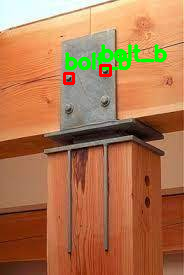

Image 1 done...
--------------------------------------------------


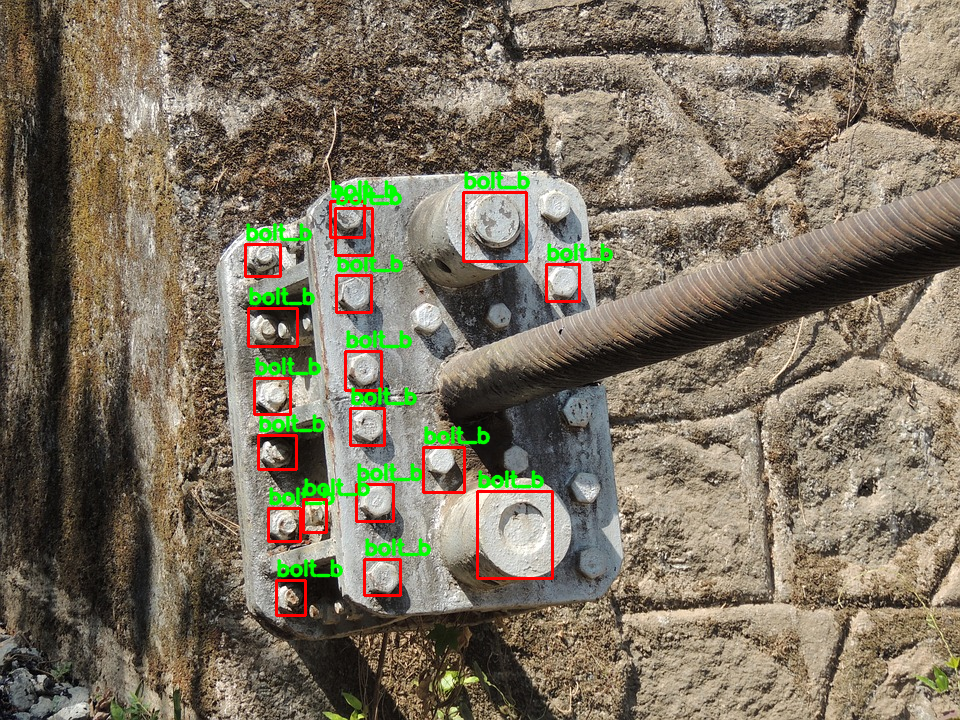

Image 2 done...
--------------------------------------------------


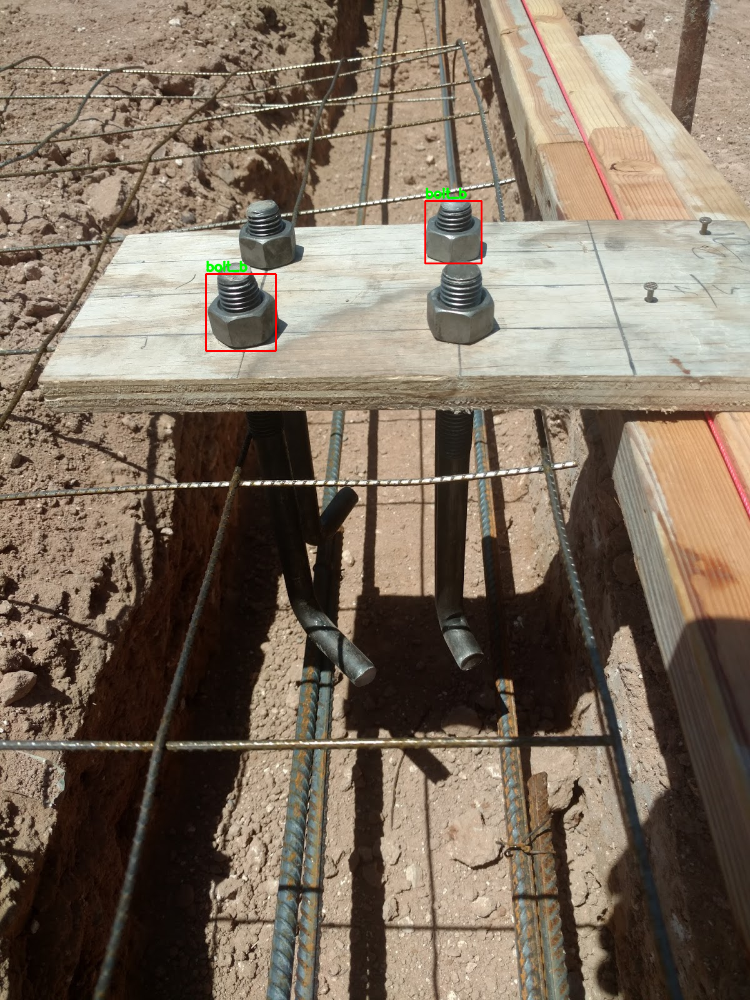

Image 3 done...
--------------------------------------------------


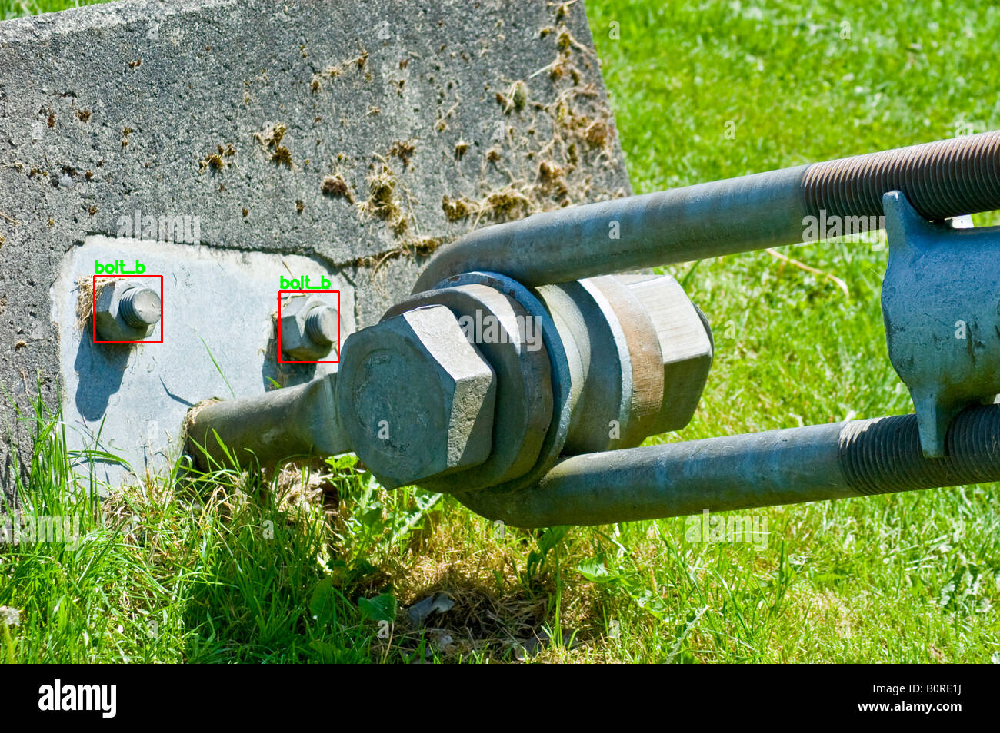

Image 4 done...
--------------------------------------------------


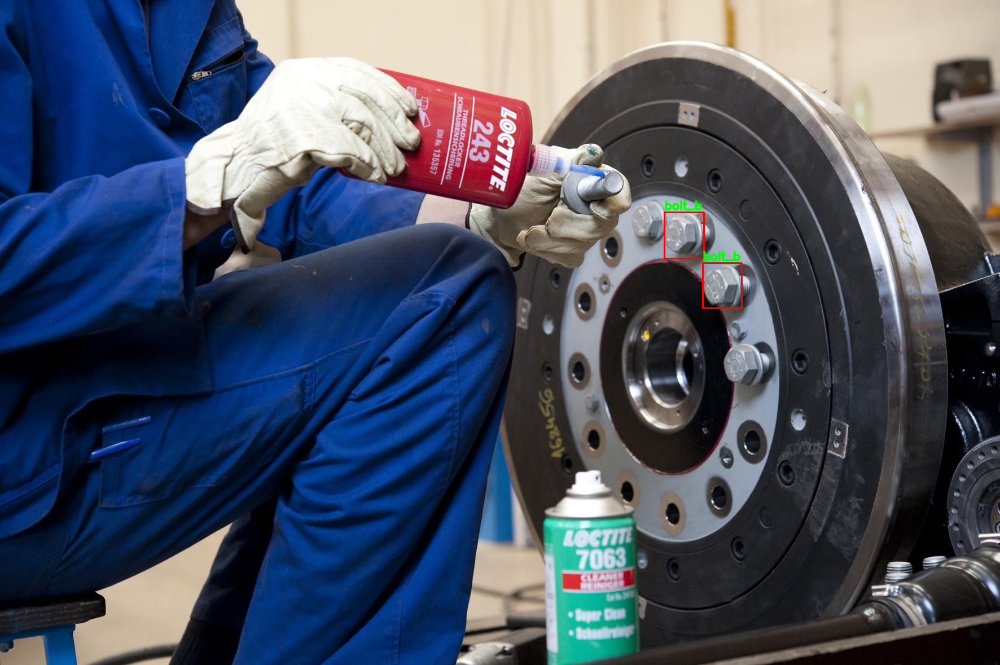

Image 5 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE


In [12]:
from google.colab.patches import cv2_imshow

for i in range(len(test_images)):
    # get the image file name for saving output later on
    image_name = test_images[i].split('/')[-1].split('.')[0]
    image = cv2.imread(test_images[i])
    orig_image = image.copy()
    # BGR to RGB
    image = cv2.cvtColor(orig_image, cv2.COLOR_BGR2RGB).astype(np.float32)
    # make the pixel range between 0 and 1
    image /= 255.0
    # bring color channels to front
    image = np.transpose(image, (2, 0, 1)).astype(np.float)
    # convert to tensor
    image = torch.tensor(image, dtype=torch.float).cuda()
    # add batch dimension
    image = torch.unsqueeze(image, 0)
    with torch.no_grad():
        outputs = model(image)

    # load all detection to CPU for further operations
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    # carry further only if there are detected boxes
    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()
        # filter out boxes according to `detection_threshold`
        boxes = boxes[scores >= detection_threshold].astype(np.int32)
        draw_boxes = boxes.copy()
        # get all the predicited class names
        pred_classes = [CLASSES[i] for i in outputs[0]['labels'].cpu().numpy()]

        # draw the bounding boxes and write the class name on top of it
        for j, box in enumerate(draw_boxes):
            cv2.rectangle(orig_image,
                        (int(box[0]), int(box[1])),
                        (int(box[2]), int(box[3])),
                        (0, 0, 255), 2)
            cv2.putText(orig_image, pred_classes[j],
                        (int(box[0]), int(box[1]-5)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0),
                        2, lineType=cv2.LINE_AA)
        cv2_imshow(orig_image)
        cv2.waitKey(1)
        cv2.imwrite(f"../test_predictions/{image_name}.jpg", orig_image,)
    print(f"Image {i+1} done...")
    print('-'*50)
print('TEST PREDICTIONS COMPLETE')
cv2.destroyAllWindows()